In [1]:
%pip install segment-geospatial groundingdino-py leafmap localtileserver

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.3/82.3 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.3/75.3 kB 4.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 3.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 11.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.8/73.8 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 502.9/502.9 kB 24.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 71.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━

In [1]:
import leafmap
from samgeo import tms_to_geotiff
from samgeo.text_sam import LangSAM

In [2]:
# Import necessary libraries
import leafmap
import json
import geopandas as gpd # Import geopandas for reading local files

# ... (rest of your code)
m = leafmap.Map( )

# Load GeoJSON and add to map
# Use geopandas to read the local GeoJSON file
geojson_data = gpd.read_file('/content/ahmedabad_10km_buffer.geojson')
m.add_geojson(geojson_data, layer_name="AOI")

# Extract bbox from GeoJSON
geojson_dict = json.loads(geojson_data.to_json())
bbox = geojson_data.total_bounds
print("Using bbox from GeoJSON:", bbox)
  # Average of min and max latitude

# Initialize map with calculated center

m.add_basemap("SATELLITE")
m.fit_bounds = bbox
m
# ... (rest of your code using the 'bbox' variable)

Using bbox from GeoJSON: [ 228639.00079887 2526061.97214742  274527.85436267 2571215.54879463]


Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [3]:
if m.user_roi_bounds() is not None:
    bbox = m.user_roi_bounds()
else:
    bbox = [-122.2659, 37.8682, -122.2521, 37.8741]

m.user_roi_bounds()

[72.6099, 23.0544, 72.6123, 23.0567]

In [4]:
image = "satellite.tif"
tms_to_geotiff(output=image, bbox=bbox, zoom=19, source="Satellite", overwrite=True)

Downloaded image 01/25
Downloaded image 02/25
Downloaded image 03/25
Downloaded image 04/25
Downloaded image 05/25
Downloaded image 06/25
Downloaded image 07/25
Downloaded image 08/25
Downloaded image 09/25
Downloaded image 10/25
Downloaded image 11/25
Downloaded image 12/25
Downloaded image 13/25
Downloaded image 14/25
Downloaded image 15/25
Downloaded image 16/25
Downloaded image 17/25
Downloaded image 18/25
Downloaded image 19/25
Downloaded image 20/25
Downloaded image 21/25
Downloaded image 22/25
Downloaded image 23/25
Downloaded image 24/25
Downloaded image 25/25
Saving GeoTIFF. Please wait...
Image saved to satellite.tif


In [5]:
m.layers[-1].visible = False
m.add_raster(image, layer_name="Image")
m

Map(bottom=29135950.0, center=[23.05555, 72.6111], controls=(ZoomControl(options=['position', 'zoom_in_text', …

In [6]:
sam = LangSAM()

GroundingDINO_SwinB.cfg.py:   0%|          | 0.00/1.01k [00:00<?, ?B/s]

final text_encoder_type: bert-base-uncased


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

groundingdino_swinb_cogcoor.pth:   0%|          | 0.00/938M [00:00<?, ?B/s]

Downloading: "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth" to /root/.cache/torch/hub/checkpoints/sam_vit_h_4b8939.pth
100%|██████████| 2.39G/2.39G [00:32<00:00, 78.5MB/s]


In [ ]:
# text_prompt1="trees "

In [ ]:
# text_prompt = "group of trees"

final text_encoder_type: bert-base-uncased
Processing prompt: tree
Processing prompt: trees
Processing prompt: group of trees
Processing prompt: forest
Processing prompt: wooded area
Processing prompt: tree canopy


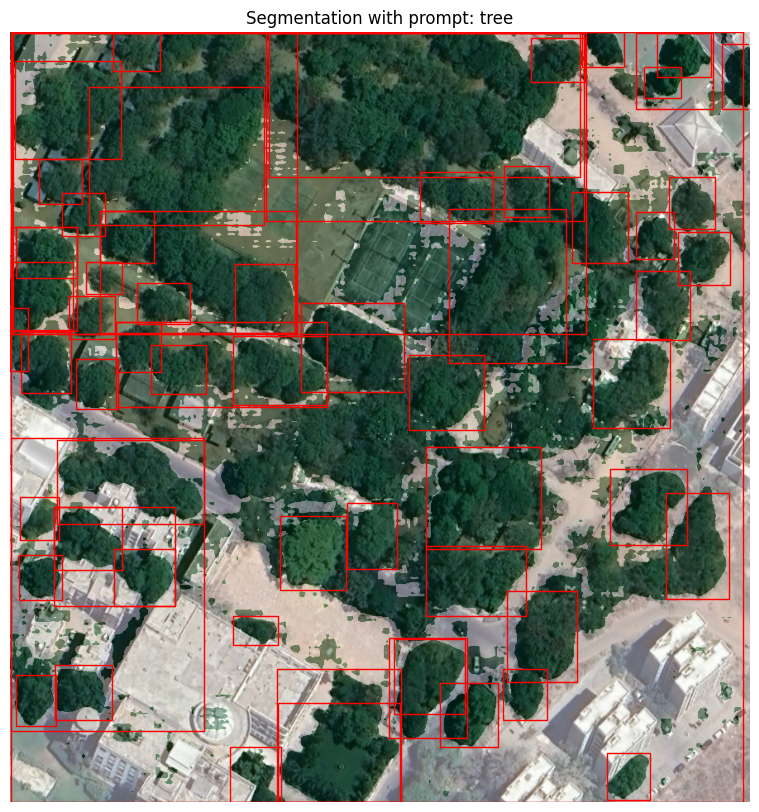

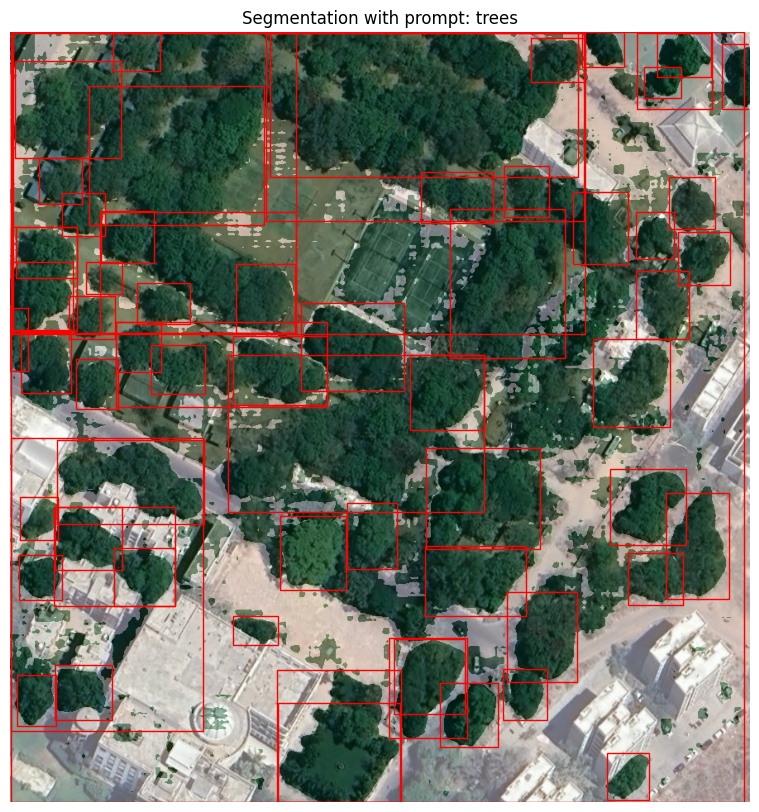

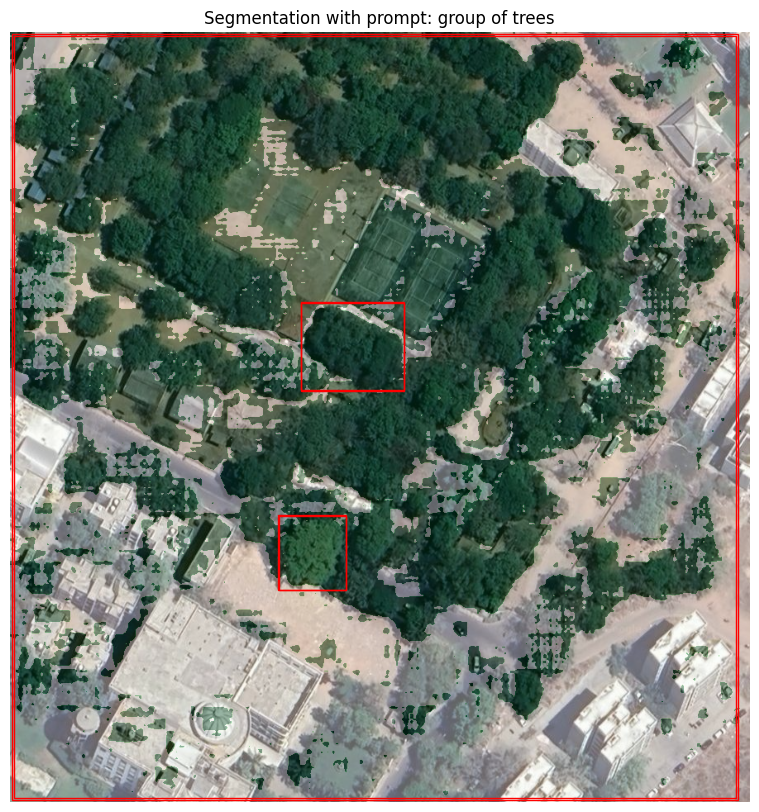

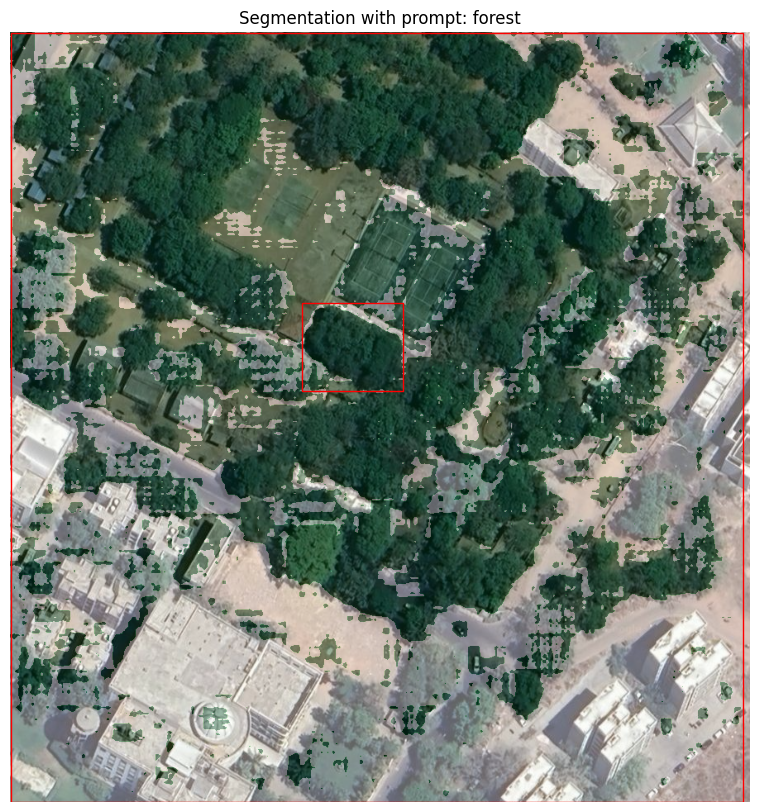

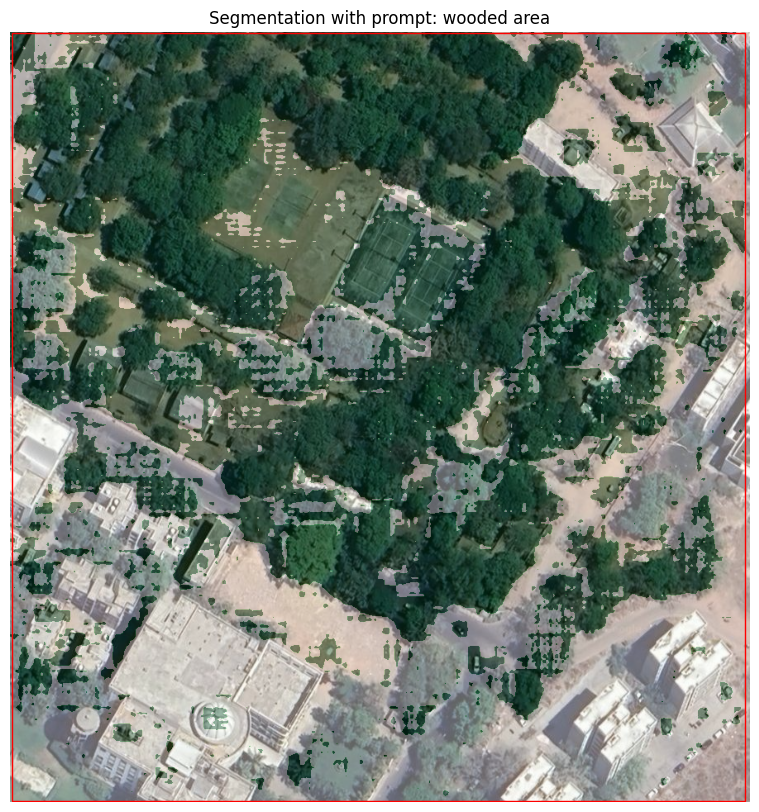

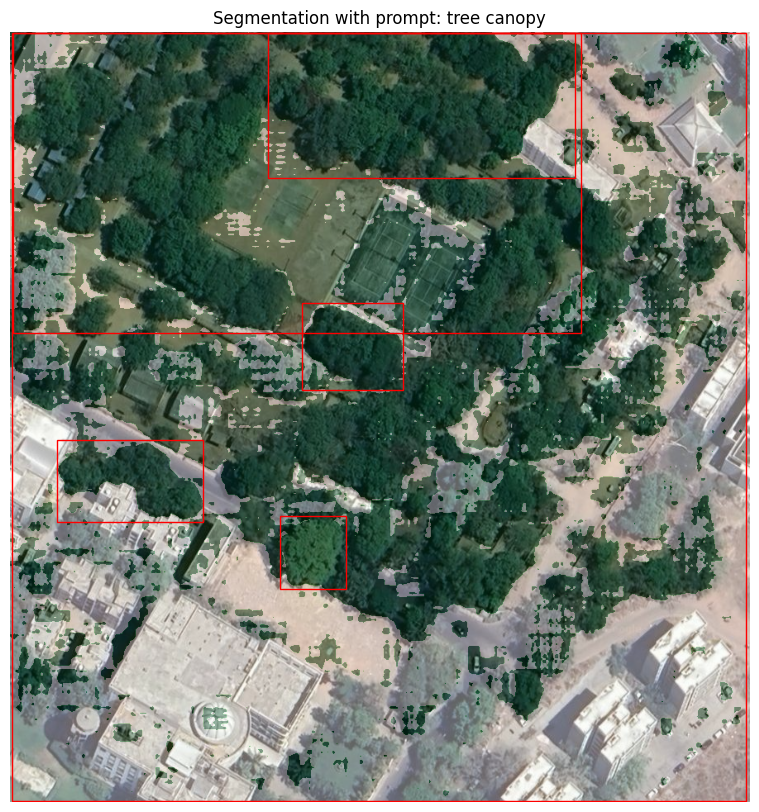

In [7]:
import leafmap
from samgeo import tms_to_geotiff
from samgeo.text_sam import LangSAM

# Initialize LangSAM
sam = LangSAM()

# Define your text prompts
prompts = [
    "tree",
    "trees",
    "group of trees",
    "forest",
    "wooded area",
    "tree canopy",
]

# Create a dictionary to store results
results = {}

# Loop through each prompt
for prompt in prompts:
    print(f"Processing prompt: {prompt}")

    # Perform prediction
    sam.predict(image, prompt, box_threshold=0.20, text_threshold=0.20)

    # Store masks in the results dictionary
    results[prompt] = sam.masks

    # Display results (optional)
    sam.show_anns(
        cmap="Greens",
        box_color="red",
        title=f"Segmentation with prompt: {prompt}",
        blend=True,
    )

# Compare results (add your preferred comparison logic here)
# For example, you could calculate metrics like IoU or Dice coefficient
# for each prompt and then select the best one.

In [12]:
text_prompt = "tree"

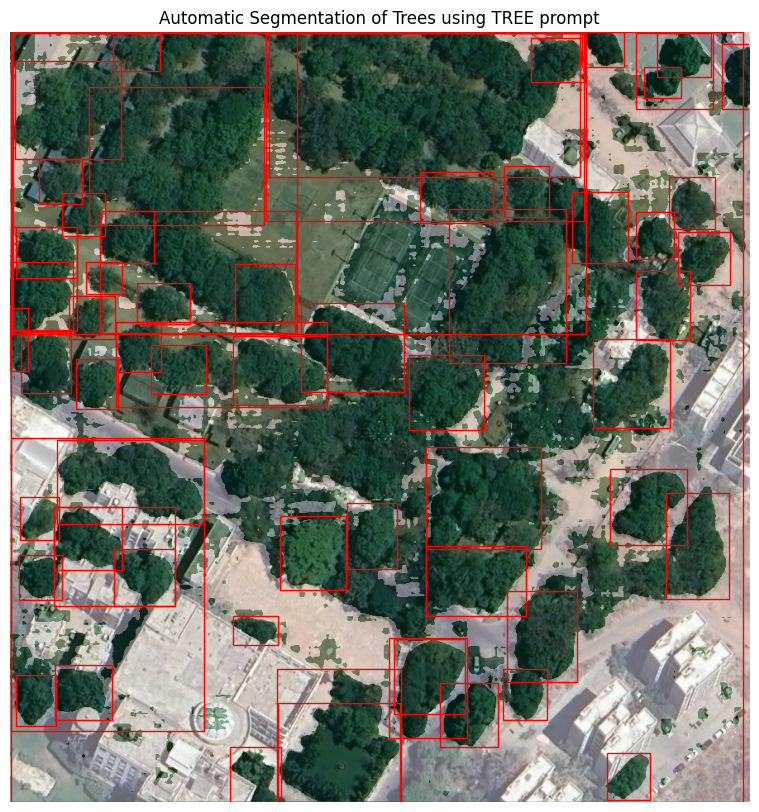

In [15]:
sam.predict(image, text_prompt, box_threshold=0.20, text_threshold=0.20)
sam.show_anns(
    cmap="Greens",
    box_color="red",
    title="Automatic Segmentation of Trees using TREE prompt",
    blend=True,
)

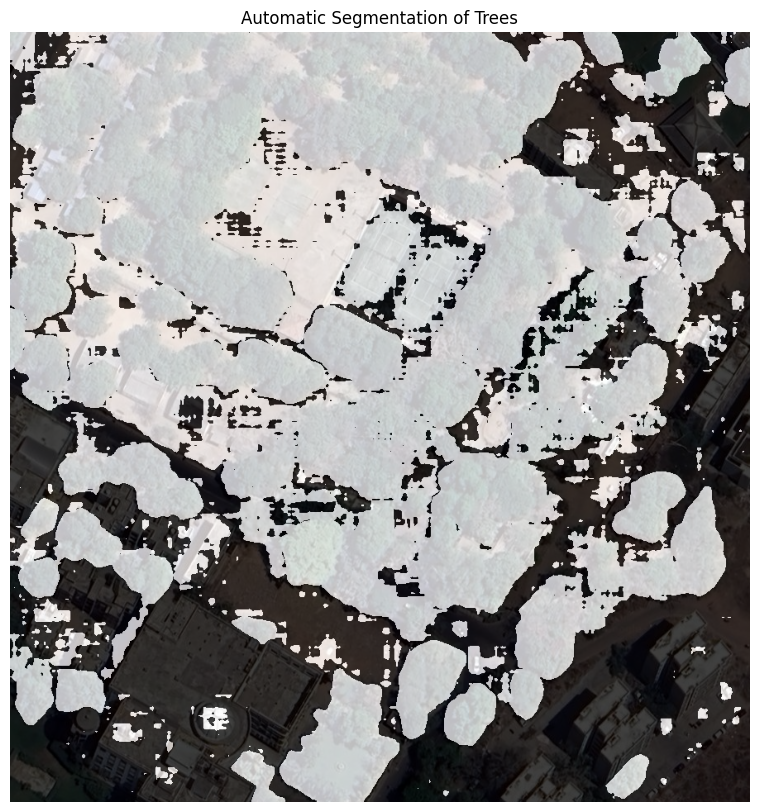

In [16]:
sam.show_anns(
    cmap="Greys_r",
    add_boxes=False,
    alpha=0.75,
    title="Automatic Segmentation of Trees",
    blend=False,
    output="trees.tif",
)

In [17]:
sam.raster_to_vector("trees.tif", "trees.shp")

In [18]:
m.add_raster("trees.tif", layer_name="Trees", palette="Greens", opacity=0.5, nodata=0)
style = {
    "color": "#3388ff",
    "weight": 2,
    "fillColor": "#7c4185",
    "fillOpacity": 0.5,
}
m.add_vector("trees.shp", layer_name="Vector", style=style)
m

Map(bottom=14568126.0, center=[23.05555, 72.6111], controls=(ZoomControl(options=['position', 'zoom_in_text', …

ERROR:localtileserver.web.application:Exception on /api/tiles/17/91972/56906.png [GET]
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/flask/app.py", line 880, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.10/dist-packages/flask/app.py", line 865, in dispatch_request
    return self.ensure_sync(self.view_functions[rule.endpoint])(**view_args)  # type: ignore[no-any-return]
  File "/usr/local/lib/python3.10/dist-packages/flask_restx/api.py", line 402, in wrapper
    resp = resource(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/flask/views.py", line 110, in view
    return current_app.ensure_sync(self.dispatch_request)(**kwargs)  # type: ignore[no-any-return]
  File "/usr/local/lib/python3.10/dist-packages/flask_restx/resource.py", line 41, in dispatch_request
    resp = meth(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/flask_caching/__init__.py", line 426, in decorated_fu

In [19]:
sam.show_map()

Map(center=[23.05555, 72.6111], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'z…

In [20]:
import rasterio
from rasterio.windows import Window
import os

def split_raster(image_path, out_dir="tiles", tile_size=(1000, 1000), overlap=0):
    os.makedirs(out_dir, exist_ok=True)

    with rasterio.open(image_path) as src:
        width, height = src.width, src.height
        tile_width, tile_height = tile_size
        x_overlap, y_overlap = overlap, overlap

        # Calculate the number of tiles in each direction
        n_cols = (width - x_overlap) // (tile_width - x_overlap)
        n_rows = (height - y_overlap) // (tile_height - y_overlap)

        for i in range(int(n_rows)):
            for j in range(int(n_cols)):
                # Calculate the window position
                x_off = j * (tile_width - x_overlap)
                y_off = i * (tile_height - y_overlap)

                # Create a Window for the tile
                window = Window(x_off, y_off, tile_width, tile_height)

                # Read the data in the window
                tile = src.read(window=window)

                # Define the output path
                out_path = os.path.join(out_dir, f"tile_{i}_{j}.tif")

                # Write the tile
                with rasterio.open(
                    out_path,
                    'w',
                    driver='GTiff',
                    height=tile_height,
                    width=tile_width,
                    count=src.count,
                    dtype=tile.dtype,
                    crs=src.crs,
                    transform=src.window_transform(window)
                ) as dst:
                    dst.write(tile)

# Example usage
split_raster("/content/satellite.tif")


In [21]:
import rasterio
from rasterio.windows import Window
import os
import math

def split_raster(image_path, out_dir="tiles", tile_size=(100, 100), overlap=0):
    # Ensure the output directory exists
    os.makedirs(out_dir, exist_ok=True)

    with rasterio.open(image_path) as src:
        width, height = src.width, src.height
        tile_width, tile_height = tile_size
        x_overlap, y_overlap = overlap, overlap

        # Calculate the number of tiles in each direction, ensuring full coverage
        n_cols = math.ceil((width - x_overlap) / (tile_width - x_overlap))
        n_rows = math.ceil((height - y_overlap) / (tile_height - y_overlap))

        tile_count = 0  # To keep track of tile numbers
        for i in range(int(n_rows)):
            for j in range(int(n_cols)):
                # Calculate the offset for each tile
                x_off = j * (tile_width - x_overlap)
                y_off = i * (tile_height - y_overlap)

                # Calculate window dimensions ensuring they stay within image bounds
                window_width = min(tile_width, width - x_off)
                window_height = min(tile_height, height - y_off)

                # Skip if window dimensions are invalid
                if window_width <= 0 or window_height <= 0:
                    continue

                # Define the window for this tile
                window = Window(x_off, y_off, window_width, window_height)

                # Read the data within this window
                tile = src.read(window=window)

                # Define the output path for each tile, using tile_count for unique naming
                out_path = os.path.join(out_dir, f"tile_{tile_count}.tif")
                tile_count += 1

                # Write each tile to its own file
                with rasterio.open(
                    out_path,
                    'w',
                    driver='GTiff',
                    height=window_height,
                    width=window_width,
                    count=src.count,
                    dtype=tile.dtype,
                    crs=src.crs,
                    transform=src.window_transform(window)
                ) as dst:
                    dst.write(tile)

    print(f"Total tiles created: {tile_count}")

# Example usage
split_raster("/content/satellite.tif")


Total tiles created: 90


In [22]:
# text_prompt = "tree"  # Assign the desired text prompt

sam.predict_batch(
    images="tiles",
    out_dir="masks",
    text_prompt=text_prompt,  # Use the defined text_prompt variable
    box_threshold=0.24,
    text_threshold=0.80,
    mask_multiplier=255,
    dtype="uint8",
    merge=True,
    verbose=True,
)

Processing image 01 of 90: tiles/tile_0.tif...
Processing image 02 of 90: tiles/tile_1.tif...
Processing image 03 of 90: tiles/tile_10.tif...
Processing image 04 of 90: tiles/tile_11.tif...
Processing image 05 of 90: tiles/tile_12.tif...
Processing image 06 of 90: tiles/tile_13.tif...
Processing image 07 of 90: tiles/tile_14.tif...
Processing image 08 of 90: tiles/tile_15.tif...
Processing image 09 of 90: tiles/tile_16.tif...
No objects found in the image.
Processing image 10 of 90: tiles/tile_17.tif...
No objects found in the image.
Processing image 11 of 90: tiles/tile_18.tif...
Processing image 12 of 90: tiles/tile_19.tif...
Processing image 13 of 90: tiles/tile_2.tif...
Processing image 14 of 90: tiles/tile_20.tif...
Processing image 15 of 90: tiles/tile_21.tif...
Processing image 16 of 90: tiles/tile_22.tif...
No objects found in the image.
Processing image 17 of 90: tiles/tile_23.tif...
Processing image 18 of 90: tiles/tile_24.tif...
Processing image 19 of 90: tiles/tile_25.tif..

In [23]:
m.add_raster("masks/merged.tif", cmap="viridis", nodata=0, layer_name="Mask")
m.add_layer_manager()
m

Map(bottom=14568126.0, center=[23.05555, 72.6111], controls=(ZoomControl(options=['position', 'zoom_in_text', …

ERROR:localtileserver.web.application:Exception on /api/tiles/17/91972/56905.png [GET]
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/flask/app.py", line 880, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.10/dist-packages/flask/app.py", line 865, in dispatch_request
    return self.ensure_sync(self.view_functions[rule.endpoint])(**view_args)  # type: ignore[no-any-return]
  File "/usr/local/lib/python3.10/dist-packages/flask_restx/api.py", line 402, in wrapper
    resp = resource(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/flask/views.py", line 110, in view
    return current_app.ensure_sync(self.dispatch_request)(**kwargs)  # type: ignore[no-any-return]
  File "/usr/local/lib/python3.10/dist-packages/flask_restx/resource.py", line 41, in dispatch_request
    resp = meth(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/flask_caching/__init__.py", line 426, in decorated_fu

Pixel Resolution: 0.29851036637438744 meters/pixel
Number of trees detected: 68
Total area covered by trees: 91515.64 square meters


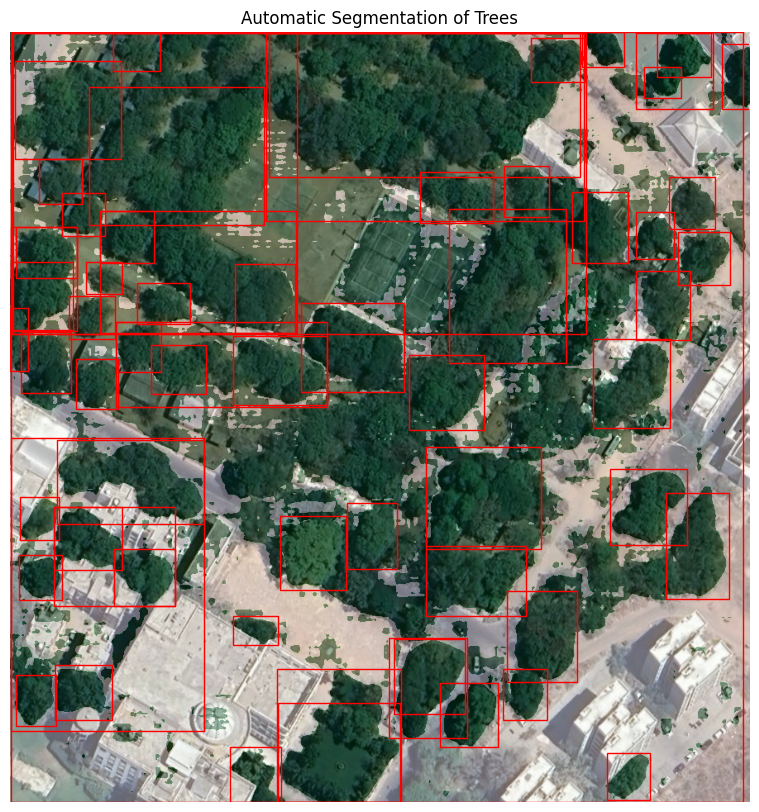

In [24]:
# ... (your existing code) ...

results=sam.predict(image, text_prompt, box_threshold=0.20, text_threshold=0.80)
sam.show_anns(
    cmap="Greens",
    box_color="red",
    title="Automatic Segmentation of Trees",
    blend=True,
)

# Count bounding boxes and area
masks = sam.masks

num_trees = len(masks)  # Number of trees detected


# Calculate area
import rasterio
with rasterio.open(image) as src:
    resolution = src.res[0]  # Assuming square pixels, resolution in meters/pixel
    print(f"Pixel Resolution: {resolution} meters/pixel")

total_tree_area = 0
for mask in masks:
    tree_area_pixels = mask.sum()
    tree_area_sq_meters = tree_area_pixels * (resolution ** 2)
    total_tree_area += tree_area_sq_meters

print(f"Number of trees detected: {num_trees}")
print(f"Total area covered by trees: {total_tree_area:.2f} square meters")